In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import lime.lime_tabular
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from sklearn.model_selection import train_test_split
from SyntheticDataset import SyntheticDataset
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from PerformanceAnalysis import PerformanceAnalysis
from Visualization import Visualization

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Setup

In [2]:
config_file = open('config.json')
config_vars = json.load(config_file)
config_file.close()

logs_dir = config_vars["logs_dir"]

In [3]:
config_file = open('visual_config.json')
visual_vars = json.load(config_file)
config_file.close()

shap_colors_neg = visual_vars["shap_colors"]["negative"]
shap_colors_pos = visual_vars["shap_colors"]["positive"]
shap_colors = np.array([tuple(shap_colors_neg), tuple(shap_colors_pos)])

title_size = visual_vars["title_font_size"]
label_size = visual_vars["labels_font_size"]

green_color = tuple([x/255 for x in visual_vars["green_colors"]["c2"]])

# Multi-Classe Classification

## Create the Dataset

In [5]:
min_val = -100
max_val = 100
num_rows = 3750
num_features = 10
num_classes = 5
rand_coef = [[0, 1, 1, 1, 1],
             [1, 0, 1, 1, 1],
             [1, 1, 0, 1, 1],
             [1, 1, 1, 0, 1],
             [1, 1, 1, 1, 0],
             [0.5, 0.5, 0.5, 0.5, 0.5],
             [0.6, 0.6, 0.6, 0.6, 0.6],
             [0.7, 0.7, 0.7, 0.7, 0.7],
             [0.8, 0.8, 0.8, 0.8, 0.8],
             [0.9, 0.9, 0.9, 0.9, 0.9]]


features_names = ["Var" + (str(x)) for x in range(num_features)]
dataset = SyntheticDataset(min_val, max_val, num_rows, num_features, num_classes, rand_coef, seed=42)
dataset.generate()
dataset.get_data()

array([[  0,  79,  -8, ...,   0,   0,   0],
       [-13,   4,  -1, ..., -99,  20,   1],
       [-63,  29, -12, ..., -36, -52,   2],
       ...,
       [-24,  55, -12, ..., -65,  27,   2],
       [ 98, -81, -46, ...,  67,  65,   3],
       [-97, -10,  96, ...,  65,  -6,   4]])

## Split the Dataset

In [6]:
X_train, X_test, Y_train, Y_test = train_test_split(
    dataset.get_x(),dataset.get_y(), test_size=0.20, random_state=42
)

X_train_pd = pd.DataFrame(X_train, columns=features_names)
X_test_pd = pd.DataFrame(X_test, columns=features_names)

## Instance to extract local explanations for all models

In [7]:
Exp_index = 3
Exp_inst = X_test[Exp_index, :]
Exp_inst_pd = X_test_pd.iloc[Exp_index, :]
Exp_inst_class = Y_test[Exp_index]
print(f"Instance:\n{Exp_inst_pd}\n\nClass: {Exp_inst_class}") #"Name" and "dtype" are not part of the instance, they must be ignored

Instance:
Var0   -99
Var1    56
Var2    95
Var3   -36
Var4   -40
Var5    48
Var6   -91
Var7   -48
Var8   -22
Var9   -42
Name: 3, dtype: int32

Class: 4


# Classification

In [ ]:
perf_analysis = PerformanceAnalysis()

In [8]:
# from sklearn.preprocessing import StandardScaler, MaxAbsScaler, RobustScaler
# 
# scaler = MaxAbsScaler()
# scaler.fit(X_train)
# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)

## <i>Logistic Regression</i> (LR)

In [9]:
lr_clf = LogisticRegression(max_iter=2000).fit(X_train, Y_train)

Accuracy: 30.9%


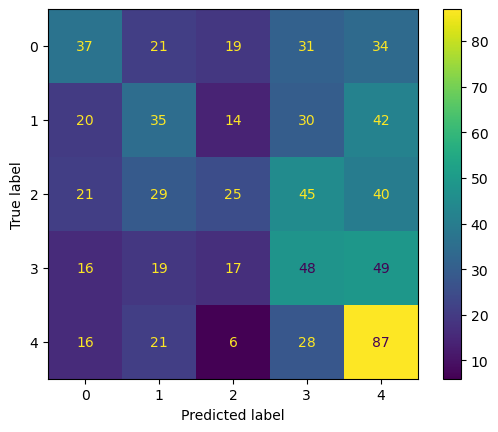

In [10]:
lr_ye = lr_clf.predict(X_test)
lr_cm = confusion_matrix(Y_test, lr_ye)

lr_acc = 1 - (np.sum(Y_test != lr_ye) / len(Y_test))
print(f"Accuracy: {round(lr_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, lr_ye)

plt.show()

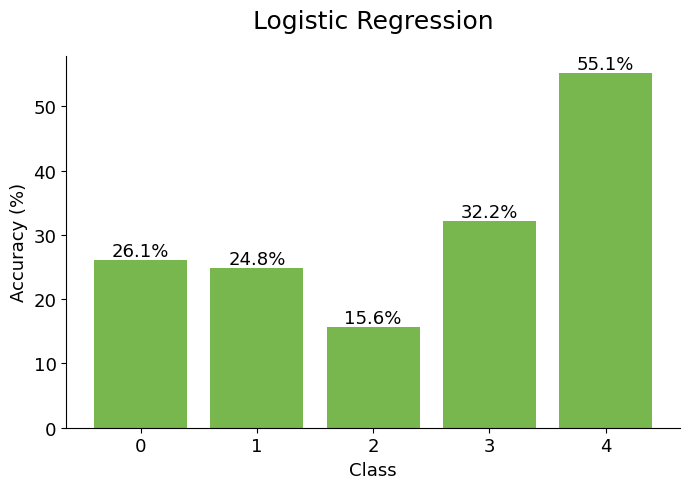

In [11]:
plt.figure(figsize=(7,5))

perf_analysis.acc_for_class(lr_cm, colors=green_color, title="Logistic Regression")

plt.show()

### Extract Explanations

#### Local - <i>Local Model-Agnostic Explanations</i> (LIME)

In [12]:
lr_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
lr_LIME_explanation = lr_LIME_explainer.explain_instance(X_test[0, :], lr_clf.predict_proba)

In [13]:
lr_LIME_explanation.show_in_notebook(show_table=True)

#### Global - <i>SHapley Additive exPlanations</i> (SHAP)

In [14]:
shap.initjs()

In [15]:
lr_SHAP_exp = shap.KernelExplainer(lr_clf.predict_proba, shap.sample(X_train_pd, 80))

In [16]:
lr_shap_values = lr_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/750 [00:00<?, ?it/s]

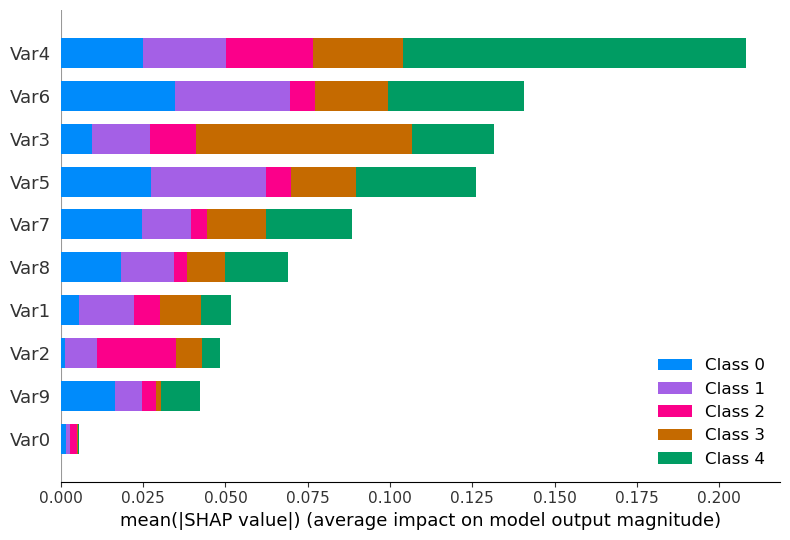

In [17]:
shap.summary_plot(lr_shap_values, X_test_pd, plot_type="bar", class_inds="original")

## <i>Random Forest</i> (RF)

In [18]:
rf_clf = RandomForestClassifier().fit(X_train, Y_train)

Accuracy: 99.3%


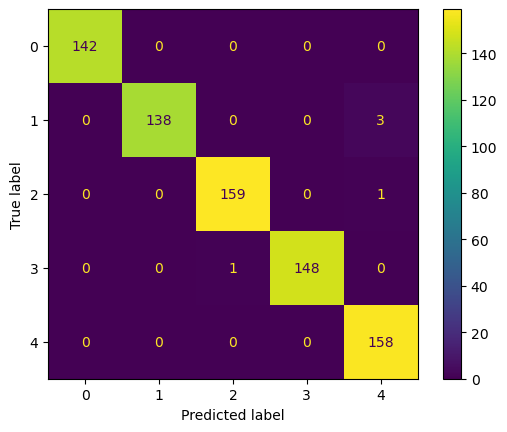

In [19]:
rf_ye = rf_clf.predict(X_test)
rf_cm = confusion_matrix(Y_test, rf_ye)

rf_acc = 1 - (np.sum(Y_test != rf_ye) / len(Y_test))
print(f"Accuracy: {round(rf_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, rf_ye)

plt.show()

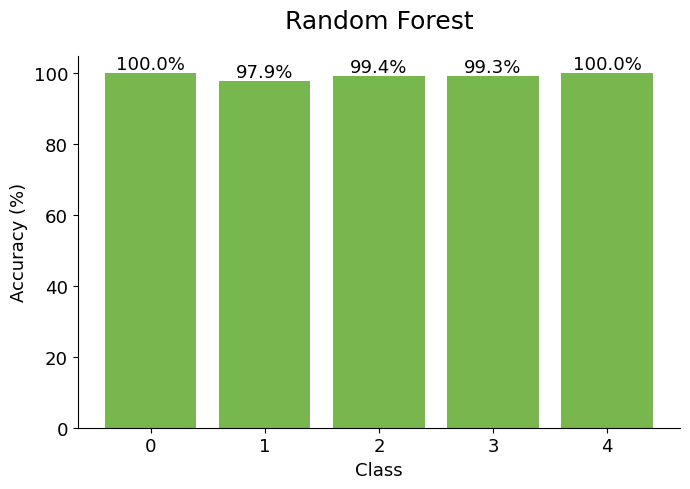

In [20]:
plt.figure(figsize=(7,5))

perf_analysis.acc_for_class(rf_cm, colors=green_color, title="Random Forest")

plt.show()

### Extract Explanations


##### Local - <i>Local Model-Agnostic Explanations</i> (LIME)

In [21]:
rf_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
rf_LIME_explanation = rf_LIME_explainer.explain_instance(X_test[0, :], rf_clf.predict_proba)

In [22]:
rf_LIME_explanation.show_in_notebook(show_table=True)

#### Global - <i>SHapley Additive exPlanations</i> (SHAP)

In [23]:
rf_SHAP_exp = shap.Explainer(rf_clf)

In [24]:
rf_shap_values = rf_SHAP_exp.shap_values(X_test_pd)

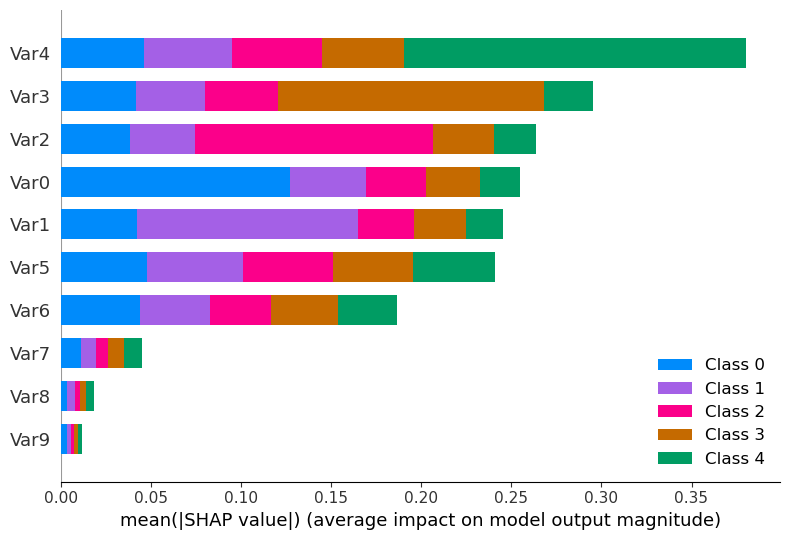

In [25]:
shap.summary_plot(rf_shap_values, X_test_pd, plot_type="bar", class_inds="original")

# <i>Support Vector Machines</i> (SVM)

In [26]:
svm_clf = SVC(probability=True).fit(X_train, Y_train)

Accuracy: 61.6%


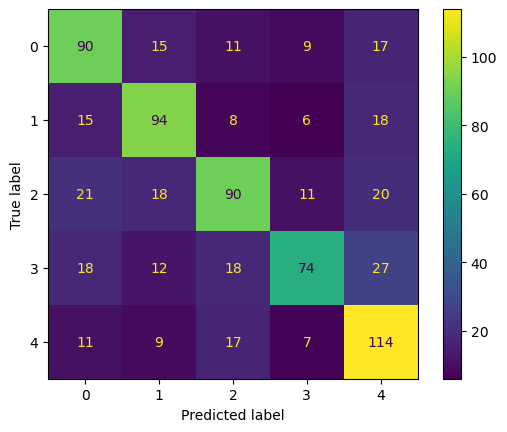

In [27]:
svm_ye = svm_clf.predict(X_test)
svm_cm = confusion_matrix(Y_test, svm_ye)

svm_acc = 1 - (np.sum(Y_test != svm_ye) / len(Y_test))
print(f"Accuracy: {round(svm_acc * 100, 1)}%")

ConfusionMatrixDisplay.from_predictions(Y_test, svm_ye)

plt.show()

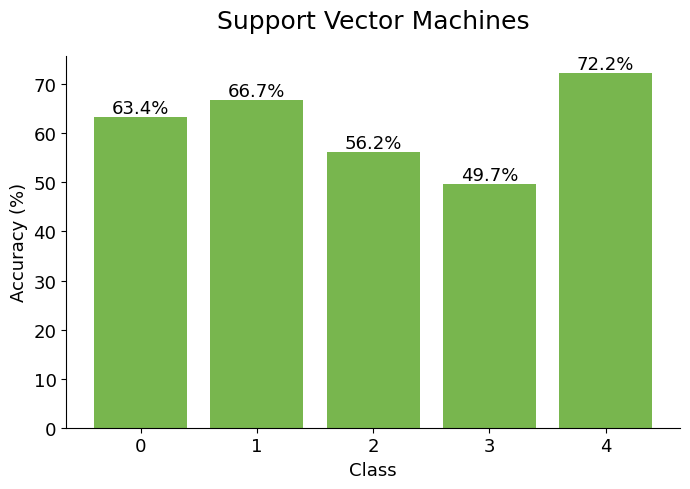

In [28]:
plt.figure(figsize=(7,5))

perf_analysis.acc_for_class(svm_cm, colors=green_color, title="Support Vector Machines")

plt.show()

### Extract Explanations


#### Local - <i>Local Model-Agnostic Explanations</i> (LIME)

In [29]:
svm_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
svm_LIME_explanation = svm_LIME_explainer.explain_instance(X_test[0], svm_clf.predict_proba)

In [30]:
svm_LIME_explanation.show_in_notebook(show_table=True)

#### Global - <i>SHapley Additive exPlanations</i> (SHAP)

In [31]:
svm_SHAP_exp = shap.KernelExplainer(svm_clf.predict_proba, shap.sample(X_train_pd, 2))

In [32]:
svm_shap_values = svm_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/750 [00:00<?, ?it/s]

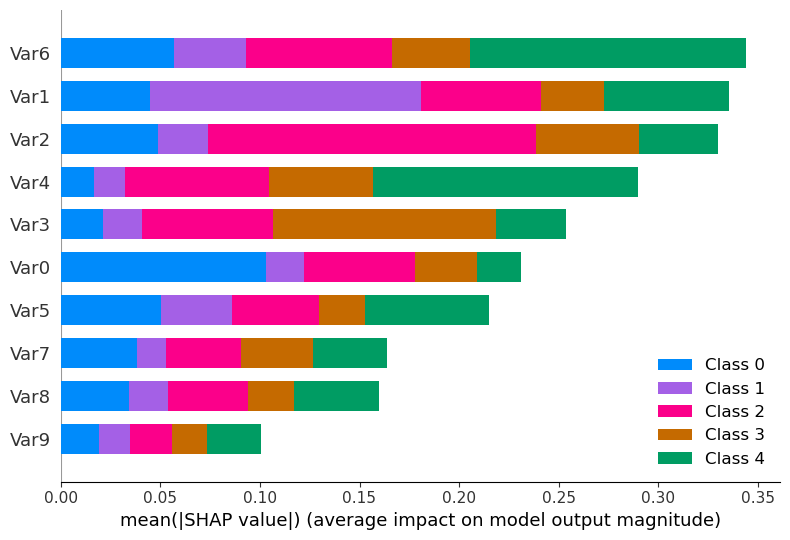

In [33]:
shap.summary_plot(svm_shap_values, X_test_pd, plot_type="bar", class_inds="original")

## <i>Explainable Boosting Machine</i> (EBM)

In [34]:
ebm_clf = ExplainableBoostingClassifier(interactions=0)
ebm_clf.fit(X_train_pd, Y_train)

ExplainableBoostingClassifier(interactions=0)

Accuracy: 99.6%


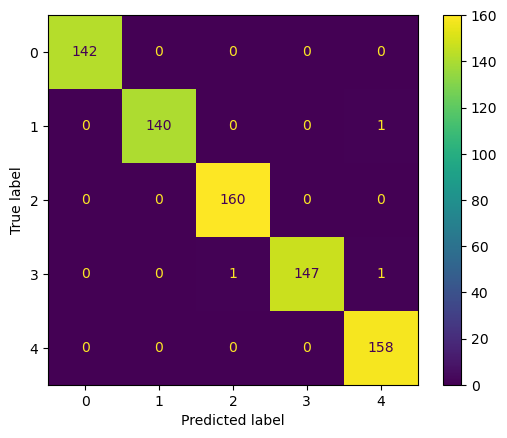

In [35]:
ebm_ye = ebm_clf.predict(X_test)
ebm_cm = confusion_matrix(Y_test, ebm_ye)

ebm_acc = 1 - (np.sum(Y_test != ebm_ye) / len(Y_test))
print(f"Accuracy: {round(ebm_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, ebm_ye)

plt.show()

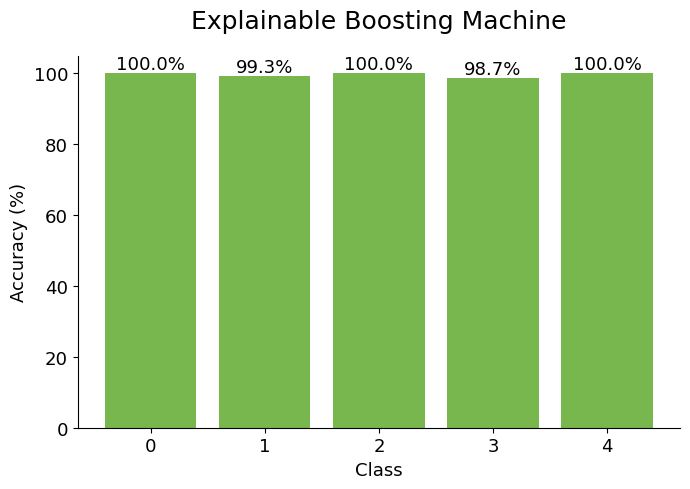

In [36]:
plt.figure(figsize=(7,5))

labels_plt = [range(5) for x in range(5)]

perf_analysis.acc_for_class(ebm_cm, colors=green_color, title="Explainable Boosting Machine", labels=labels_plt[0])

plt.show()

### Extract Explanations

In [37]:
ebm_global = ebm_clf.explain_global()
show(ebm_global)

<!-- http://127.0.0.1:7001/1809114893648/ -->

In [38]:
ebm_local = ebm_clf.explain_local(X_test, Y_test)
show(ebm_local)

<!-- http://127.0.0.1:7001/1809079741072/ -->

# Summary

In [39]:
visual = Visualization()

## Metrics

In [40]:
accs = [round(x, 3) for x in [lr_acc, rf_acc, svm_acc, ebm_acc]]
accs_pd = pd.DataFrame(data=[accs], index=["accuracy"], columns=["LR", "RF", "SVM", "EBM"])
display(accs_pd)

,LR,RF,SVM,EBM
accuracy,0.309,0.993,0.616,0.996


In [41]:
latex_str = ''.join([" & " + x for x in accs_pd.columns]) + " \\\ \n"

In [42]:
for i, row in accs_pd.iterrows():

    aux_str = ""
    for k in row:
        aux_str += f" & {k}"

    latex_str += aux_str[3:] + " \\\ \n"

with open(f"{logs_dir}/synth_multi_metrics.txt", "w") as text_file:
    print(latex_str, file=text_file)

## Confusion Matrices

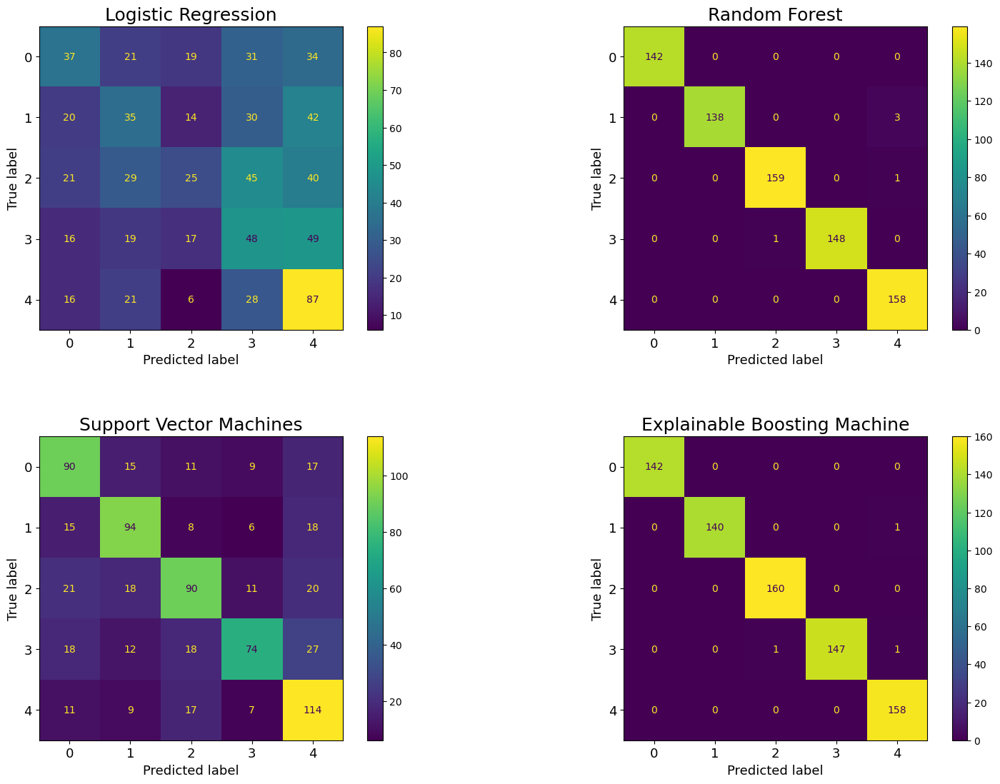

In [45]:
visual.confusion_matrices([Y_test, Y_test, Y_test, Y_test], 
                          [lr_ye, rf_ye, svm_ye, ebm_ye],
                          nrows=2, 
                          ncols=2, 
                          figsize=(15,10),
                          title_size=title_size,
                          label_size=label_size,
                          titles=["Logistic Regression", "Random Forest", "Support Vector Machines", "Explainable Boosting Machine"])

plt.savefig(f"{logs_dir}/synth_multi_conf_matrices.png", bbox_inches="tight")

plt.show()

## Local Explanations

In [46]:
lr_LIME_explanation.show_in_notebook(show_table=True)

In [47]:
rf_LIME_explanation.show_in_notebook(show_table=True)

In [48]:
svm_LIME_explanation.show_in_notebook(show_table=True)

In [49]:
ebm_local = ebm_clf.explain_local(X_test, Y_test)
show(ebm_local, key=Exp_index)

<!-- http://127.0.0.1:7001/1809124844816/ -->

## Global Explanations

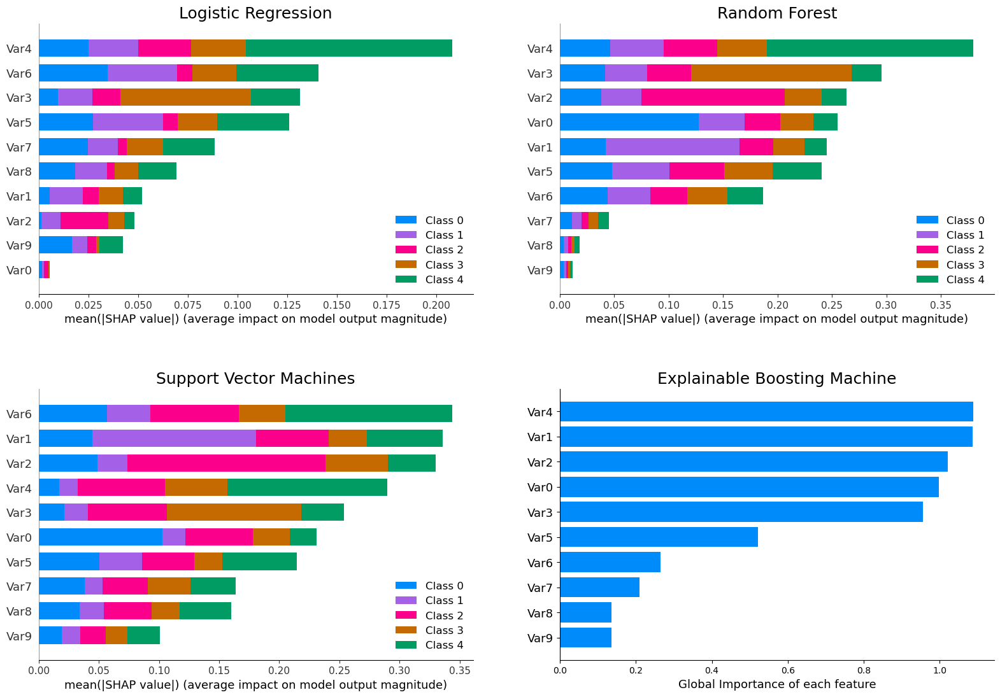

In [50]:
global_shap_values = [lr_shap_values,
                      rf_shap_values,
                      svm_shap_values]

visual.global_shap(global_shap_values,
                   X_test_pd,
                   ebm_global.data(),
                   nrows = 2,
                   ncols = 2,
                   figsize = (15,10),
                   title_size = title_size,
                   label_size = label_size,
                   titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                   shap_colors = shap_colors/255)

plt.savefig(f"{logs_dir}/synth_multi_global_SHAP_EBM.png", bbox_inches="tight")

plt.show()